In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import os
import plotly.io as pio
pio.templates.default = "plotly_white"
import pandas as pd
from pathlib import Path
from tqdm.autonotebook import tqdm
from IPython.display import display, HTML
# %load_ext autoreload
# %autoreload 2
np.random.seed()
tqdm.pandas()

/tmp/ipykernel_7717/1114571209.py:9: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


Components of a time series:
1. Trend
2. Seasonal
3. Cyclical
4. Irregular

$$Y = Trend + Seasonal + Cyclical + Irregular$$

$$Y = Trend * Seasonal * Cyclical * Irregular$$

## Trend Component
- The trend is a long-term change in the mean of a time series.
- It is the smooth and steady movement of a time series in a particular direction.

## Seasonal Component
- The seasonal component is the recurring pattern of a time series that repeats itself every period.
- It is the recurring ups and downs within a period.

## Cyclical Component
- The cyclical component is the recurring pattern of a time series that repeats itself every period.
- It is the recurring ups and downs within a period.

In [3]:
DATA_FOLDER_PATH = "/home/bilal326/Time_Series/data/london_smart_meters"

block_df = pd.read_parquet(f"{DATA_FOLDER_PATH}/preprocessed/london_smart_meters_merged_block_0-7.parquet")

In [6]:
#Converting to expanded form
from data_utils import compact_to_expanded

exp_block_df = compact_to_expanded(block_df[block_df.file=="block_7"], timeseries_col = 'energy_consumption',\
                                   static_cols = ["frequency", "series_length", "stdorToU", "Acorn", "Acorn_grouped",\
                                                   "file"],time_varying_cols = ['holidays', 'visibility', 'windBearing', 'temperature','dewPoint',\
                                                                                'pressure', 'apparentTemperature', 'windSpeed', 'precipType', 'icon', 'humidity', 'summary'],\
                                                                                    ts_identifier = "LCLid")

# Taking a single time series from the block
ts_df = exp_block_df[exp_block_df.LCLid=="MAC000193"].set_index("timestamp")

ts_df["weekday_name"] = ts_df.index.day_name()
ts_df["weekday"] = ts_df.index.weekday
ts_df["week"] = ts_df.index.isocalendar().week
ts_df["day"] = ts_df.index.day
ts_df["hour"] = ts_df.index.hour
ts_df["date"] = ts_df.index.date
ts_df["month"] = ts_df.index.month
ts_df["month_name"] = ts_df.index.month_name()
ts_df["year"] = ts_df.index.year

#Making ordered categoricals to make for sorted plots
ts_df['month_name'] = pd.Categorical(ts_df['month_name'], categories=["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"], ordered=True)
ts_df['weekday_name'] = pd.Categorical(ts_df['weekday_name'], categories=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"], ordered=True)


  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:00<00:00, 74.93it/s]


In [ ]:
# !wget https://raw.githubusercontent.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/refs/heads/main/src/imputation/interpolation.py

--2025-06-28 18:18:05--  https://raw.githubusercontent.com/PacktPublishing/Modern-Time-Series-Forecasting-with-Python/refs/heads/main/src/imputation/interpolation.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6820 (6.7K) [text/plain]
Saving to: ‘interpolation.py.1’

interpolation.py.1  100%[===================>]   6.66K  --.-KB/s    in 0.001s  

2025-06-28 18:18:06 (5.10 MB/s) - ‘interpolation.py.1’ saved [6820/6820]



1. Line Charts

In [8]:
#Interpolating Missing values
# from src.imputation.interpolation import SeasonalInterpolation


ts_df['energy_consumption'] = ts_df['energy_consumption'].interpolate(method='linear')

In [9]:
fig = px.line(ts_df, y="energy_consumption", title="Energy Consumption for MAC000193")
# fig = format_plot(fig, ylabel="Energy Consumption")
fig.show()

2. Rolling Average Plot (rolling avg)


When you have a long time series with high variation, as we have, the line plot can get a bit chaotic.
One of the options to get a macro view of the time series in terms of trends and movement is to plot
a smoothed version of the time series.

In [10]:
ts_df["rolling_monthly_avg"] = ts_df["energy_consumption"].rolling(window=48*30).mean()

fig = px.line(ts_df, y="rolling_monthly_avg", title="Rolling Monthly Average Energy Consumption for MAC000193")
fig.show()

Another use for the line chart is to visualize two or more time series together and investigate any
correlations between them.

In [11]:
import plotly.graph_objects as go

fig = go.Figure()

# Add first y-axis (Energy Consumption)
fig.add_trace(go.Scatter(
    x=ts_df.index,
    y=ts_df['energy_consumption'],
    name='Energy Consumption',
    yaxis='y1',
    line=dict(color='blue')
))

# Add second y-axis (Temperature)
fig.add_trace(go.Scatter(
    x=ts_df.index,
    y=ts_df['temperature'],
    name='Temperature',
    yaxis='y2',
    line=dict(color='red', dash='dash')
))

# Set layout with dual y-axes
fig.update_layout(
    title='Temperature and Energy Consumption',
    xaxis=dict(title='Time'),
    yaxis=dict(
        title=dict(text='Energy Consumption', font=dict(color='blue')),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title=dict(text='Temperature', font=dict(color='red')),
        tickfont=dict(color='red'),
        anchor='x',
        overlaying='y',
        side='right'
    ),
    legend=dict(x=0.01, y=0.99),
    width=900,
    height=500
)


fig.show()


In [12]:
import plotly.graph_objects as go

# Create rolling averages (e.g., 48*30 for ~monthly)
ts_df['energy_rolling'] = ts_df['energy_consumption'].rolling(window=48*30).mean()
ts_df['temp_rolling'] = ts_df['temperature'].rolling(window=48*30).mean()

fig = go.Figure()

# Rolling Energy Consumption (y-axis 1)
fig.add_trace(go.Scatter(
    x=ts_df.index,
    y=ts_df['energy_rolling'],
    name='Energy Consumption (Rolling Avg)',
    yaxis='y1',
    line=dict(color='blue')
))

# Rolling Temperature (y-axis 2)
fig.add_trace(go.Scatter(
    x=ts_df.index,
    y=ts_df['temp_rolling'],
    name='Temperature (Rolling Avg)',
    yaxis='y2',
    line=dict(color='red', dash='dash')
))

# Layout with dual axes
fig.update_layout(
    title='Rolling Monthly Averages: Temperature and Energy Consumption',
    xaxis=dict(title='Time'),
    yaxis=dict(
        title=dict(text='Energy Consumption (Rolling Avg)', font=dict(color='blue')),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title=dict(text='Temperature (Rolling Avg)', font=dict(color='red')),
        tickfont=dict(color='red'),
        anchor='x',
        overlaying='y',
        side='right'
    ),
    legend=dict(x=0.01, y=0.99),
    width=900,
    height=500
)

fig.show()


Seasonal plots

A seasonal plot is very similar to a line plot, but the key difference here is that the x-axis denotes the
“seasons,” the y-axis denotes the time series value

And the different seasonal cycles are represented
in different colors or line types.

In [13]:
plot_df = ts_df[~ts_df.year.isin([2011, 2014])].groupby(["year", "month_name"])[['energy_consumption',"temperature"]].mean().reset_index()



fig = px.line(plot_df, x="month_name", y='energy_consumption', color="year", line_dash="year", title="Seasonal Plot - Monthly")
# fig = format_plot(fig, ylabel="Energy Consumption", xlabel="Month")
fig.show()

/tmp/ipykernel_7717/3793814189.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



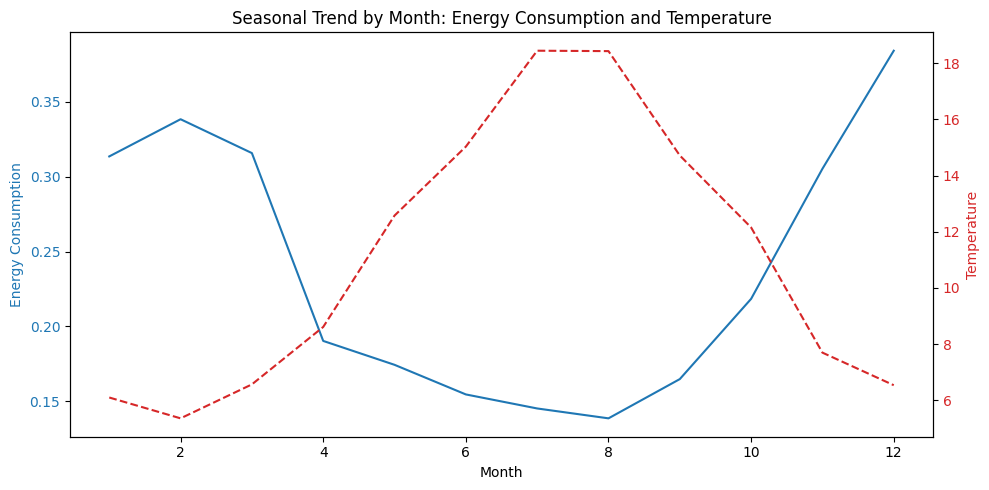

In [14]:
import matplotlib.pyplot as plt
import pandas as pd

# Make sure datetime index
ts_df['month'] = ts_df.index.month
ts_df['hour'] = ts_df.index.hour

# Monthly averages
monthly_avg = ts_df.groupby('month')[['energy_consumption', 'temperature']].mean()

# Plot
fig, ax1 = plt.subplots(figsize=(10, 5))

color = 'tab:blue'
ax1.set_xlabel('Month')
ax1.set_ylabel('Energy Consumption', color=color)
ax1.plot(monthly_avg.index, monthly_avg['energy_consumption'], color=color, label='Energy Consumption')
ax1.tick_params(axis='y', labelcolor=color)

# Second y-axis
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Temperature', color=color)
ax2.plot(monthly_avg.index, monthly_avg['temperature'], color=color, linestyle='--', label='Temperature')
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Seasonal Trend by Month: Energy Consumption and Temperature')
fig.tight_layout()
plt.show()


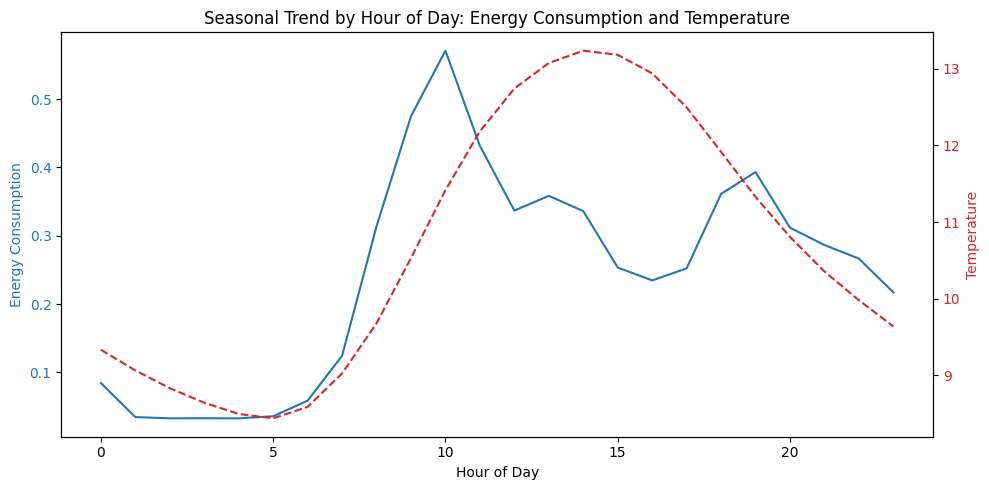

In [15]:
# Hourly averages
hourly_avg = ts_df.groupby('hour')[['energy_consumption', 'temperature']].mean()

fig, ax1 = plt.subplots(figsize=(10, 5))

color = 'tab:blue'
ax1.set_xlabel('Hour of Day')
ax1.set_ylabel('Energy Consumption', color=color)
ax1.plot(hourly_avg.index, hourly_avg['energy_consumption'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Temperature', color=color)
ax2.plot(hourly_avg.index, hourly_avg['temperature'], color=color, linestyle='--')
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Seasonal Trend by Hour of Day: Energy Consumption and Temperature')
fig.tight_layout()
plt.show()


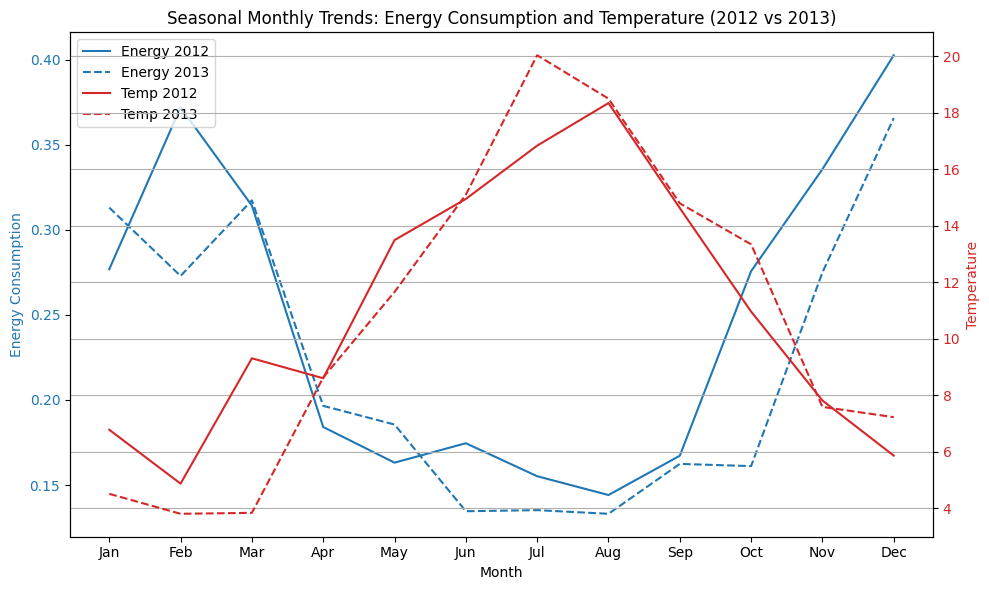

In [16]:
import matplotlib.pyplot as plt
import pandas as pd

# Make sure datetime index is set
ts_df['month'] = ts_df.index.month
ts_df['year'] = ts_df.index.year

# Filter for 2012 and 2013
season_df = ts_df[ts_df['year'].isin([2012, 2013])]

# Monthly averages
monthly_avg = season_df.groupby(['year', 'month'])[['energy_consumption', 'temperature']].mean().reset_index()

# Pivot to get separate columns for plotting
energy_pivot = monthly_avg.pivot(index='month', columns='year', values='energy_consumption')
temp_pivot = monthly_avg.pivot(index='month', columns='year', values='temperature')

# Plot
fig, ax1 = plt.subplots(figsize=(10, 6))

# Left y-axis (Energy)
color_energy = 'tab:blue'
ax1.set_xlabel('Month')
ax1.set_ylabel('Energy Consumption', color=color_energy)
ax1.plot(energy_pivot.index, energy_pivot[2012], label='Energy 2012', color=color_energy)
ax1.plot(energy_pivot.index, energy_pivot[2013], label='Energy 2013', color=color_energy, linestyle='--')
ax1.tick_params(axis='y', labelcolor=color_energy)

# Right y-axis (Temperature)
ax2 = ax1.twinx()
color_temp = 'tab:red'
ax2.set_ylabel('Temperature', color=color_temp)
ax2.plot(temp_pivot.index, temp_pivot[2012], label='Temp 2012', color=color_temp)
ax2.plot(temp_pivot.index, temp_pivot[2013], label='Temp 2013', color=color_temp, linestyle='--')
ax2.tick_params(axis='y', labelcolor=color_temp)

# Title and legend
plt.title('Seasonal Monthly Trends: Energy Consumption and Temperature (2012 vs 2013)')

# Combine legends from both axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

# Month labels
ax1.set_xticks(range(1,13))
ax1.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                     'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.grid(True)
fig.tight_layout()
plt.show()


But when there are too many seasonal cycles to be plotted, it increases visual clutter. An alternative to a seasonal plot is a seasonal box plot.

In [17]:
plot_df =  ts_df.groupby(["date","weekday_name", "hour"])["energy_consumption"].mean().reset_index().dropna()

fig = px.box(plot_df, y="energy_consumption", x="hour", log_y=True, title="Box Plot: Day of Month-Hourly Average")
fig.update_layout(height=700) 
fig.show()

/tmp/ipykernel_7717/1998492874.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



- the seasonal box plot is much more informative.
- The horizontal line in the box tells us about the median, 
- the box is the interquartile range (IQR), and the points that are marked are the outliers.

- By looking at the medians, we can see that the peak consumption occurs from 9 A.M. onward.
- But the variability is also higher from 9 A.M.
- But the variability is also higher from 9 A.M.

In [23]:
import plotly.express as px

# Group by date, weekday name, and hour, then take the mean
plot_df2 = ts_df.groupby(["date", "weekday_name", "hour"])["energy_consumption"].mean().reset_index().dropna()

# Create pivot table: weekday as rows, hour as columns
pivot_table = plot_df2.pivot_table(index="weekday_name", columns="hour", values="energy_consumption", aggfunc='mean')

# Optional: order weekdays correctly
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pivot_table = pivot_table.reindex(weekday_order)

# Plot heatmap
fig = px.imshow(
    pivot_table,
    labels=dict(x="Hour of Day", y="Day of Week", color="Energy Consumption"),
    aspect="auto",
    color_continuous_scale="bluered",
    title="Heatmap: Hourly Energy Consumption by Day of Week"
)

fig.update_layout(xaxis_title="Hour", yaxis_title="Weekday")
fig.show()


/tmp/ipykernel_7717/3335086085.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_7717/3335086085.py:7: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



## Autocorrelation plot

- Correlation means the strength of the relationship between two variables.
- Autocorrelation is the correlation between a time series and itself at different lags.
- Autocorrelation measures how a time series value at time $t$ is **related to** its own **past values** (e.g., $t-1, t-2, \dots$).
- It tells you whether past values can help **predict** future ones and **how** they’re related.

#### ➕ Positive Autocorrelation

**Definition:**
Positive autocorrelation means that if a value is **high**, the next value (at some lag $k$) is also **likely to be high**, and if it's low, the next value is likely to be low too.

**Interpretation:**

* The series has a **momentum**-like behavior.
* Patterns **persist** — high follows high, low follows low.

**Example:**
Imagine daily temperature. If today is warm, tomorrow is also likely to be warm.

**Visual:**

High → High → High → ...
Low  → Low  → Low  → ...

#### ➖ Negative Autocorrelation

**Definition:**
Negative autocorrelation means that if a value is **high**, the next value is more likely to be **low**, and vice versa.

**Interpretation:**

* The series shows **alternating** or **mean-reverting** behavior.
* A high value is followed by a dip and then a rise again.

**Example:**
Think of a bouncing ball: every bounce goes up and then down.

**Visual:**
High → Low → High → Low → ...



In [22]:
plot_df.head()

,date,weekday_name,hour,energy_consumption
144,2012-01-01,Sunday,0,0.3770
145,2012-01-01,Sunday,1,0.0955
146,2012-01-01,Sunday,2,0.0380
147,2012-01-01,Sunday,3,0.0285
148,2012-01-01,Sunday,4,0.0360


### Partial Autocorrelation


#### 🔁 **Partial Autocorrelation (PACF)**

#### 📌 Definition:

**Partial autocorrelation** measures the **direct effect** of a time series' past value at lag $k$ on its current value, **after removing the effects of all shorter lags** (1 through $k-1$).

In simpler terms:

> It tells you how much **extra predictive power** lag $k$ adds **after accounting for** lags 1 to $k-1$.


#### 🤔 Why is this useful?

In time series (especially AR models), just looking at autocorrelation (ACF) can be misleading — you might see high correlation at lag 3, but it might just be because lag 3 is indirectly related via lag 1 and 2.

Partial autocorrelation tells you:

* Does lag $k$ have a **direct influence** on the current value?
* Or is its effect just due to its correlation with earlier lags?


#### 📉 Example: Autocorrelation vs Partial Autocorrelation

Let’s say we have a time series $X_t$, and:

* Lag 1 affects $X_t$ directly.
* Lag 2 affects $X_t$ **only because** it’s correlated with Lag 1.

Then:

* ACF might show **high** correlation at both lag 1 and 2.
* **PACF** will show **high** only at lag 1, and **near-zero** at lag 2.


#### 📈 In Practice: How it’s used

In **AR (AutoRegressive)** models:

* **PACF plot** helps you choose the order $p$ (how many lags to use).
* You look for the **last significant lag** in the PACF plot → that’s often your AR model order.


#### 📊 Quick Summary

| Term                                        | What it Measures                                        | Includes Indirect Effects? | Used For                              |
| ------------------------------------------- | ------------------------------------------------------- | -------------------------- | ------------------------------------- |
| **ACF** (Autocorrelation Function)          | Correlation of current value with past lags             | ✅ Yes                      | Identifying MA (moving average) order |
| **PACF** (Partial Autocorrelation Function) | Direct correlation of lag $k$, removing lags 1 to $k-1$ | ❌ No                       | Identifying AR (autoregressive) order |



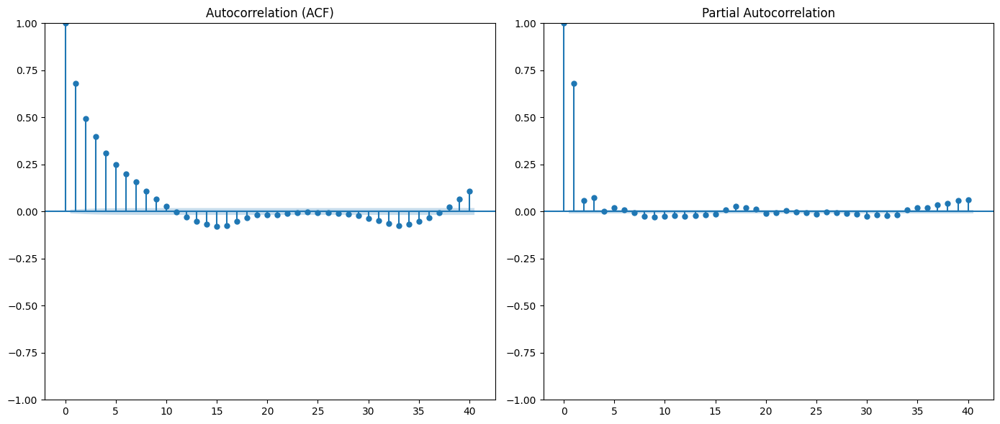

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
series = ts_df['energy_consumption'].dropna()


# Set number of lags (how far back you want to check correlation)
num_lags = 40

plt.figure(figsize=(14, 6))

# ACF plot
plt.subplot(1, 2, 1)
plot_acf(series, lags=num_lags, ax=plt.gca())
plt.title('Autocorrelation (ACF)')

# PACF plot
plt.subplot(1, 2, 2)
plot_pacf(series, lags=num_lags, ax=plt.gca(), method='ywm')  # 'ywm' is a stable method

plt.tight_layout()
plt.show()



## 📈 **Interpretation**

### ✅ ACF (Left Plot)

* **Lag 1 to \~10**: Gradually decreasing autocorrelation — this is called a **slow decay**.
* This suggests that the time series is **strongly influenced by its recent past**, and those effects **fade over time**.
* This kind of pattern is typical in an **AR (AutoRegressive)** process — especially **AR(1) or AR(2)**.

---

### ✅ PACF (Right Plot)

* **Lag 1**: Very strong spike — indicates a **strong direct effect** from lag 1.
* **Lag 2**: Also slightly significant.
* **Lag 3 and beyond**: Mostly within confidence bounds (i.e., not significant).

### 📌 This tells us:

* **Most of the predictive power comes from the first 1 or 2 lags.**
* After that, past values don’t directly contribute much.

---

### ✅ **Conclusion:**

Your time series likely follows an **AR(1)** or **AR(2)** model. Here's why:

| Indicator | Observation                        | Suggestion             |
| --------- | ---------------------------------- | ---------------------- |
| ACF       | Slowly decays                      | Autoregressive process |
| PACF      | Big spike at lag 1, possibly lag 2 | Likely AR(1) or AR(2)  |

